In [67]:
# Import des librairies

import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

import seaborn as sns

In [68]:
# Import des librairies pour le PCA

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


import pingouin as pg

In [69]:
# On règle les paramètres de pandas et de la visualisation

sns.set(font_scale = 3.5,rc={'figure.figsize':(60,20)})

pd.options.display.max_columns = 200

pd.options.display.max_rows = 1000

pd.options.display.max_colwidth = 50

In [70]:
# On importe la data que l'on a préparé dans le notebook précédent

data = pd.read_csv('data_clean.csv',low_memory=False)

In [71]:
# On récupère cette fonction du notebook précédent pour vérifier que tout va bien

def show_missing_data_graph(data):
    '''
    Affiche un graphique du % de remplissage de chaque colonne : 
    Parameters :
    ----------
    data : pd.DataFrame
    Return:
    ------
    '''
    missing_data = round((1 - data.isna().sum()/len(data)),3)
    label = missing_data.index

    sns.barplot(x = label, y = missing_data)
    plt.title('Donnée disponible',fontsize=100)
    plt.xticks(rotation=70)
    plt.tight_layout()
    plt.show()
    
def information_basique(data): 
    '''
    Affiche le .shape, .info, .describe d'un dataframe 
    Parameters :
    ----------
    data : pd.DataFrame
    Return:
    ------
    '''
    
    print('\033[1m'+'Shape :\n'+'\033[0m',data.shape,'\n')

    print('\033[1m'+'Info :'+'\033[0m')

    data.info()
    
    print('\033[1m'+'\nDescription :')
    
    display(data.describe())

In [72]:
data

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives_n,additives,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09 10:34:13,1489055653,2017-03-09 10:34:13,Organic Polenta,Bob's Red Mill,bob-s-red-mill,US,en:united-states,États-Unis,Organic polenta,35 g (0.25 cup),0.0,[ organic-polenta -> en:organic-polenta ] [...,0.0,0.0,a,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1552.0,1.43,0.120,77.140,4.600,5.7,8.57,0.510000,0.200787,-1.8,-1.8
1,0000000016612,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09 10:35:31,1489055731,2017-03-09 10:35:31,Organic Adzuki Beans,Unfi,unfi,US,en:united-states,États-Unis,Organic adzuki beans,48 g (0.25 cup),0.0,[ organic-adzuki-beans -> en:organic-adzuki-b...,0.0,0.0,a,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1393.0,1.04,0.240,62.500,11.426,12.5,22.92,0.211000,0.082756,-1.8,-1.8
2,0000000016650,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055668,2017-03-09 10:34:28,1489055668,2017-03-09 10:34:28,Organic Penne Pasta,Gardentime,gardentime,US,en:united-states,États-Unis,Organic refined durum semolina wheat flour,57 g (0.5 cup),0.0,[ organic-refined-durum-semolina-wheat-flour ...,0.0,0.0,a,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1540.0,1.75,0.000,73.680,2.102,1.8,14.04,0.030988,0.012200,-3.4,-3.4
3,0000000018173,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055667,2017-03-09 10:34:27,1489055667,2017-03-09 10:34:27,Organic Sweetened Banana Chips,Unfi,unfi,US,en:united-states,États-Unis,"Organic bananas, organic coconut oil, organic ...",30 g (0.25 cup),0.0,[ organic-bananas -> en:organic-bananas ] [...,0.0,0.0,d,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",2092.0,26.67,23.330,66.670,16.670,3.3,3.33,0.000000,0.000000,15.0,15.0
4,0000000018197,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055652,2017-03-09 10:34:12,1489055652,2017-03-09 10:34:12,Lotus Organic Brown Jasmine Rice,Unfi,unfi,US,en:united-states,États-Unis,Organic brown jasmine rice,45 g (0.25 cup),0.0,[ organic-brown-jasmine-rice -> en:organic-br...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1582.0,2.22,2.064,77.780,2.220,2.2,8.89,0.784000,0.308661,7.2,7.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236489,9787461062105,http://world-fr.openfoodfacts.org/produit/9787...,usda-ndb-import,1489092300,2017-03-09 20:45:00,1489092300,2017-03-09 20:45:00,Natural Cassava,Industria De Casabe Paul,industria-de-casabe-paul,US,en:united-states,États-Unis,Cassava.,85 g (85 GRM),0.0,[ cassava -> en:cassava ],0.0,0.0,a,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1477.0,0.00,0.000,87.060,2.350,4.7,1.18,0.030480,0.012000,-1.0,-1.0
236490,9847548283004,http://world-fr.openfoodfacts.org/produit/9847...,drmalabar,143781

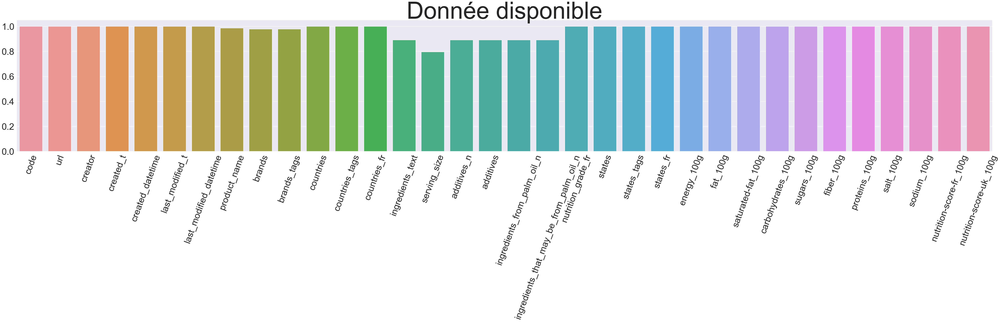

In [73]:
show_missing_data_graph(data)

In [74]:
information_basique(data)

Shape :
 (236494, 34) 

Info :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 236494 entries, 0 to 236493
Data columns (total 34 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   code                                     236494 non-null  object 
 1   url                                      236494 non-null  object 
 2   creator                                  236494 non-null  object 
 3   created_t                                236494 non-null  int64  
 4   created_datetime                         236493 non-null  object 
 5   last_modified_t                          236494 non-null  int64  
 6   last_modified_datetime                   236494 non-null  object 
 7   product_name                             233442 non-null  object 
 8   brands                                   231285 non-null  object 
 9   brands_tags                              231284 non-null  object 
 10  c

,created_t,last_modified_t,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,2.364940e+05,2.364940e+05,210734.000000,210734.000000,210734.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000,236494.000000
mean,1.474384e+09,1.482398e+09,2.086906,0.021055,0.058643,1040.742617,11.119605,4.406359,30.270675,14.904775,1.642255,6.602816,1.612307,0.654968,8.905392,8.747983
std,3.127570e+07,1.747913e+07,2.567068,0.145342,0.275350,760.311012,16.363334,7.533889,28.182111,20.711307,3.066259,7.873435,6.349154,2.674737,8.841446,8.993942
min,0.000000e+00,1.335372e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,-15.000000
25%,1.481580e+09,1.487445e+09,0.000000,0.000000,0.000000,339.000000,0.000000,0.000000,5.710000,0.900000,0.000000,0.500000,0.056000,0.023000,1.000000,1.000000
50%,1.489064e+09,1.489068e+09,1.000000,0.000000,0.000000,1004.000000,3.800000,1.000000,19.362000,4.900000,0.000000,4.040000,0.568960,0.224409,9.000000,9.000000
75%,1.489092e+09,1.489095e+09,3.000000,0.000000,0.000000,1582.000000,17.000000,6.100000,54.170000,21.210000,2.400000,9.400000,1.394460,0.550000,16.000000,16.000000
max,1.492723e+09,1.492736e+09,31.000000,2.000000,6.000000,3762.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,40.000000,36.000000


In [75]:
data.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'brands',
       'brands_tags', 'countries', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')

In [76]:
liste = list(data.columns)
liste_100_full = [k for k in liste if k.endswith('_100g')]

liste_100 = liste_100_full[1:9]

In [77]:
l = len(liste_100_full)
l

11

<AxesSubplot:xlabel='fiber_100g', ylabel='Count'>

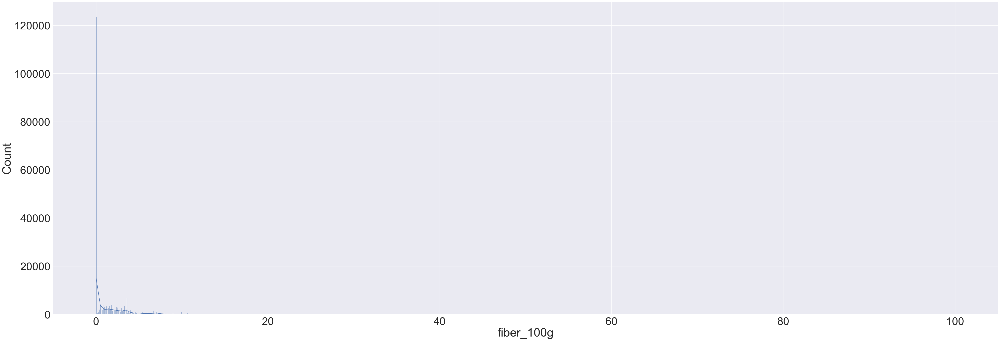

In [78]:
sns.set(font_scale = 3.5,rc={'figure.figsize':(60,20)})

sns.histplot(data=data['fiber_100g'],kde=True)

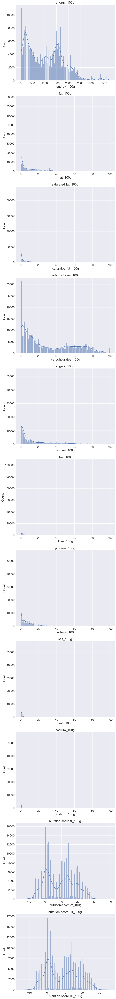

In [79]:
l = len(liste_100_full)

sns.set(font_scale = 1.5,rc={'figure.figsize':(60,20)})

fig,axes = plt.subplots(l,1,figsize=(10,100))

for i in range(l):
    ax = axes[i]
    ax.set_title(f"{liste_100_full[i]} ")
    sns.histplot(data=data[liste_100_full[i]],ax=ax,kde=True)

In [80]:
# On remarque que le nutriscore et l'energie semble avoir répartition similaire. Il y a très certainement un lien entre 
# le nutriscore et l'energie_100g

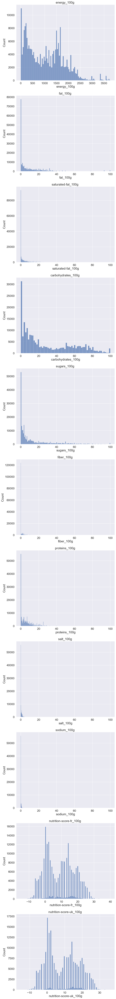

In [81]:
# On fait la même chose sans le kde

l = len(liste_100_full)

sns.set(font_scale = 1.5,rc={'figure.figsize':(60,20)})

fig,axes = plt.subplots(l,1,figsize=(10,100))

for i in range(l):
    ax = axes[i]
    ax.set_title(f"{liste_100_full[i]} ")
    sns.histplot(data=data[liste_100_full[i]],ax=ax,kde=False)

In [82]:
palette ={'a':"green", 'b':"limegreen",'c':"gold", 'd':"darkorange", 'e':"red"}


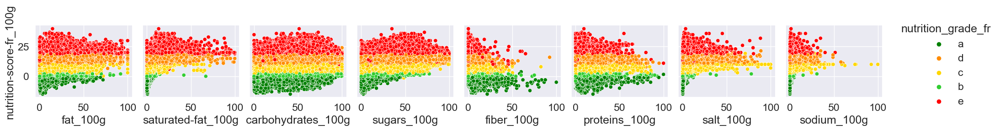

In [83]:
sns.pairplot(data=data,y_vars=['nutrition-score-fr_100g'],x_vars=liste_100,hue='nutrition_grade_fr',palette=palette)

In [84]:
# On se rappelle qu'il faut que le nutriscore soit le plus petit possible.
# On remarqueque le le gras saturé a le plus tendance à avoir une influence négative, ainsi que le sucre, et les fibres ont
# Une influence positive

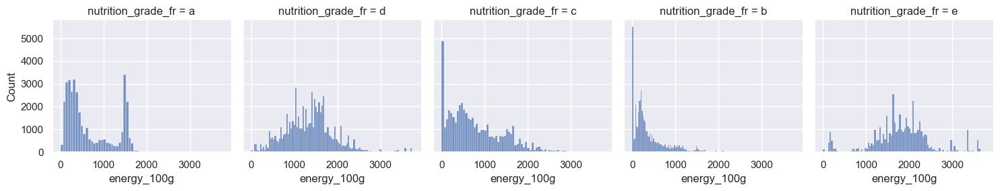

In [85]:
# On regarde si il y a une corrélation entre le nutrition grade et l'energie de l'aliment
sns.set(font_scale =1)
g = sns.FacetGrid(data, col='nutrition_grade_fr',palette=palette)
g.map(sns.histplot,'energy_100g')

In [86]:
# On va réaliser quelque boxplot ave gras,saturé, le sucre et les fibres par rapport au nutritious grade

In [87]:
palette ={'a':"green", 'b':"limegreen",'c':"gold", 'd':"darkorange", 'e':"red"}

Text(0.5, 1.0, 'fiber_100g')

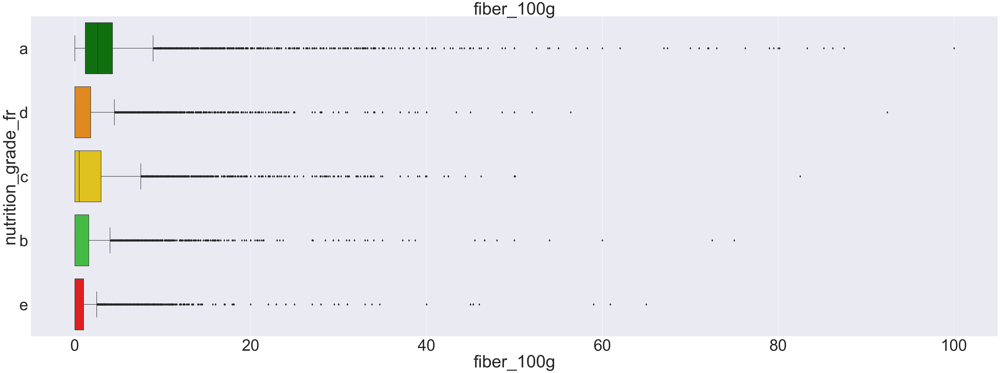

In [88]:
sns.set(font_scale=5)
sns.boxplot(x='fiber_100g',y='nutrition_grade_fr',data = data,orient='h',palette=palette)
plt.title('fiber_100g')

Text(0.5, 1.0, 'saturated-fat_100g')

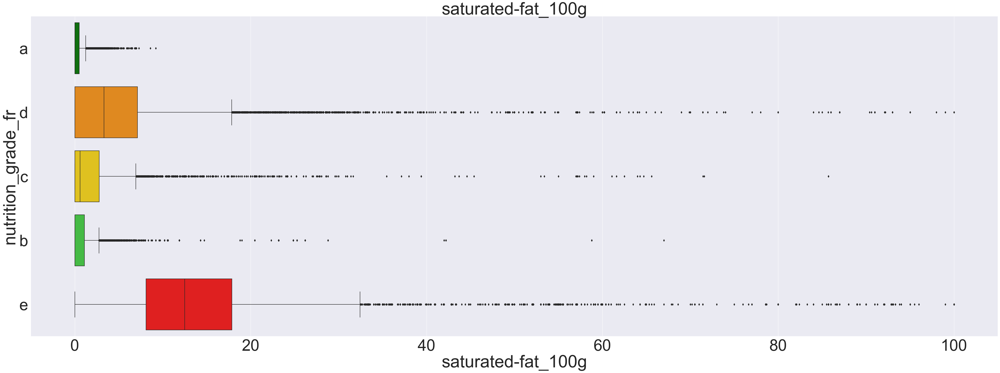

In [89]:
sns.set(font_scale=5)
sns.boxplot(x='saturated-fat_100g',y='nutrition_grade_fr',data = data,orient='h',palette=palette)
plt.title('saturated-fat_100g')

Text(0.5, 1.0, 'fat_100g')

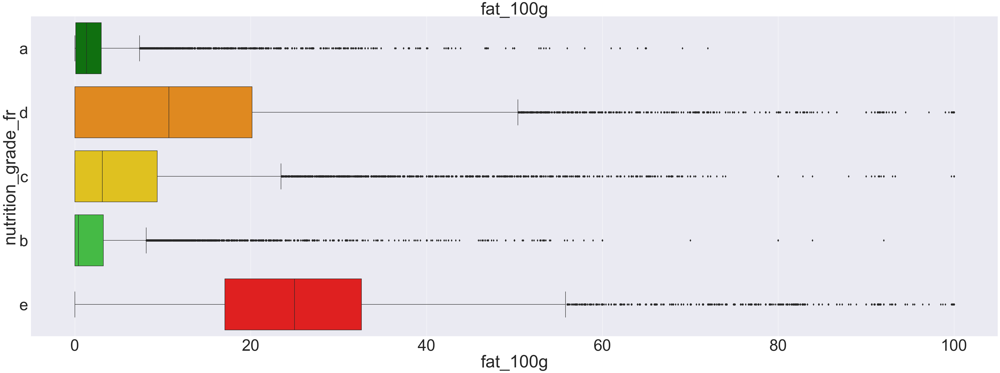

In [90]:
sns.set(font_scale=5)
sns.boxplot(x='fat_100g',y='nutrition_grade_fr',data = data,orient='h',palette=palette)
plt.title('fat_100g')

Text(0.5, 1.0, 'sugars_100g')

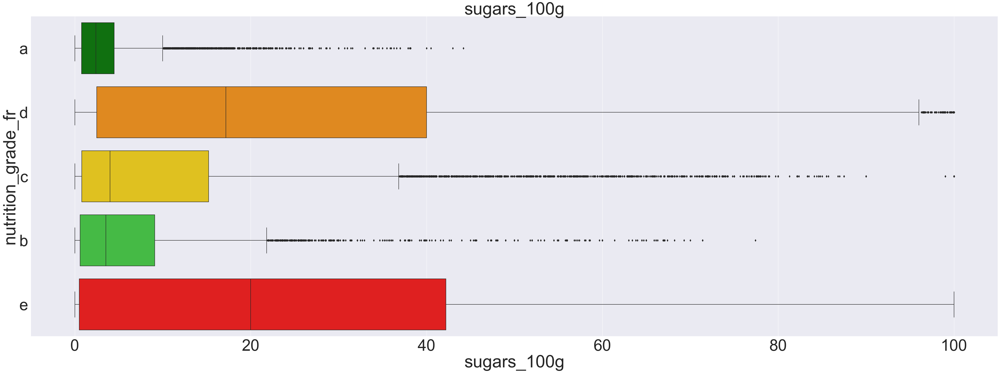

In [91]:
sns.set(font_scale=5)
sns.boxplot(x='sugars_100g',y='nutrition_grade_fr',data = data,orient='h',palette=palette)
plt.title('sugars_100g')

In [92]:
# On remarque qu'il semble y avoir beaucoup d'energie très faible pour b et c
# On va regarder pourquoi
data[data['nutrition_grade_fr']=='c'][data['energy_100g']==0]

# Cela semble être principalement des boissons. Ils ont sans doute été mal renseigné par l'utilisateur.

C:\Users\Louis\AppData\Local\Temp/ipykernel_15272/1168602191.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data[data['nutrition_grade_fr']=='c'][data['energy_100g']==0]


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives_n,additives,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
56,0000050413201,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489073107,2017-03-09 15:25:07,1489073107,2017-03-09 15:25:07,Naturally Flavored Beverage Enhancer With Othe...,Easter Unlimited Inc.,easter-unlimited-inc,US,en:united-states,États-Unis,"Apple juice from concentrate (43%), water, bla...",3.2 ml (0.75 TSP | ABOUT),3.0,[ apple-juice-from-concentrate -> en:apple-ju...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",0.0,0.000,0.00,0.00,0.0,0.0,0.0,2.38252,0.938000,10.0,10.0
61,0000105000219,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055330,2017-03-09 10:28:50,1489055330,2017-03-09 10:28:50,Green Tea,Lagg's,lagg-s,US,en:united-states,États-Unis,Green tea.,30 g (1.06 oz),0.0,[ green-tea -> en:green-tea ] [ tea -> en:t...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",0.0,0.000,4.39,2.67,0.0,0.0,0.0,0.00000,0.000000,8.0,8.0
62,0000105000318,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055331,2017-03-09 10:28:51,1489055331,2017-03-09 10:28:51,Shave Grass Herbal Tea,Lagg's,lagg-s,US,en:united-states,États-Unis,Shave grass.,30 g (1.06 oz),0.0,[ shave-grass -> en:shave-grass ] [ grass -...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",0.0,0.000,3.00,3.33,0.0,0.0,0.0,0.00000,0.000000,12.0,12.0
63,0000105000356,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055331,2017-03-09 10:28:51,1489055331,2017-03-09 10:28:51,"Herbal Tea, Chamomile * Mint",Lagg's,lagg-s,US,en:united-states,États-Unis,Chamomile spearmint.,30 g (1.06 oz),0.0,[ chamomile-spearmint -> en:chamomile-spearmi...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",0.0,0.000,3.00,3.33,0.0,0.0,0.0,0.00000,0.000000,12.0,12.0
64,0000105000363,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055331,2017-03-09 10:28:51,1489055331,2017-03-09 10:28:51,Artichoke Herbal Tea,Lagg's,lagg-s,US,en:united-states,États-Unis,Artichoke malva senna leaf hibiscus chamomile ...,30 g (1.06 oz),0.0,[ artichoke-malva-senna-leaf-hibiscus-chamomi...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",0.0,0.000,3.00,3.33,0.0,0.0,0.0,0.00000,0.000000,12.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234609,8718265743441,http://world-fr.openfoodfacts.org/produit/8718...,blipp,1468313413,2016-07-12 08:50:13,1469688582,2016-07-28 06:49:42,Basic Zout,"AH,Albert Heijn,AH basic","ah,albert-heijn,ah-basic",Nederland,en:netherlands,Pays-Bas,"zout, antiklontermiddel E500, E535",2 g,2.0,[ zout -> nl:zout ] [ antiklontermiddel -> ...,0.0,0.0,c,"en:to-be-checked, en:complete, en:nutrition-fa...","en:to-be-checked,en:complete,en:nutrition-fact...","A vérifier,Complet,Informations nutritionnelle...",0.0,0.000,0.00,0.00,0.0,0.0,0.0,100.00000,39.370079,10.0,10.0
234953,8723900207448,http://world-fr.openfoodfacts.org/produit/8723...,kiliweb,1486

In [93]:
len(data[data['energy_100g']==0])/len(data)*100

3.7341327898382204

In [94]:
data['nutrition_grade_fr'].unique()

array(['a', 'd', 'c', 'b', 'e'], dtype=object)

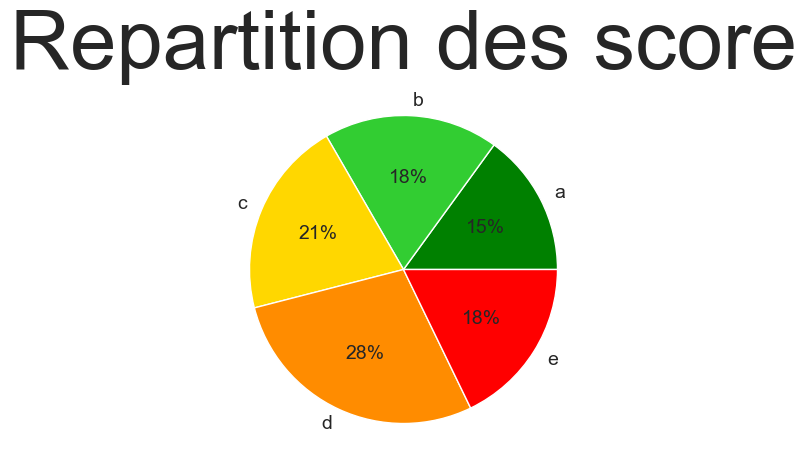

In [95]:
# On observe la répartition des grades

labels = data['nutrition_grade_fr'].value_counts().sort_index().index
sizes = data['nutrition_grade_fr'].value_counts().sort_index()
colors = ['green','limegreen','gold','darkorange','red']


plt.figure(figsize=(5,5))
plt.pie(sizes,labels = labels,colors = colors,autopct='%1.0f%%', textprops={'fontsize': 14})
plt.title('Repartition des score')

plt.show();

<AxesSubplot:>

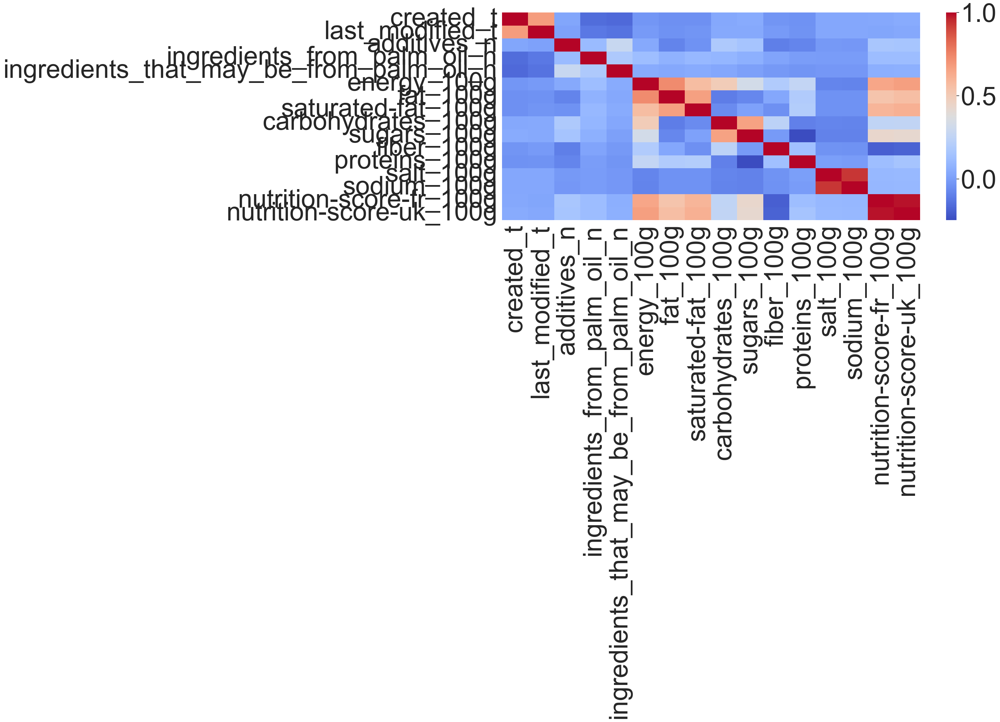

In [96]:
plt.figure(figsize=(20,8))
corr = data.corr()
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
        cmap= 'coolwarm')

# On remarque que le nutritious score est correlé princiapelement avec le sucre, le gras, le gras saturé et les fibres

In [97]:
# pour une map de correlation un peu plus claire (le bout de code a été récupéré) 
def plot_correl_map(data) :
    correl = data.corr()
    mask = np.zeros_like(correl, dtype=bool) # all false with corr shape
    mask[np.triu_indices_from(mask)] = True # Return the indices for the upper-triangle of mask

    fig, ax = plt.subplots( figsize=(10,7) )
    sns.heatmap(correl, mask=mask, vmin=-1, cmap='coolwarm', annot=True, fmt='.1g',)
    plt.show()   

In [98]:
colors=["green", "limegreen","gold", "darkorange", "red"]

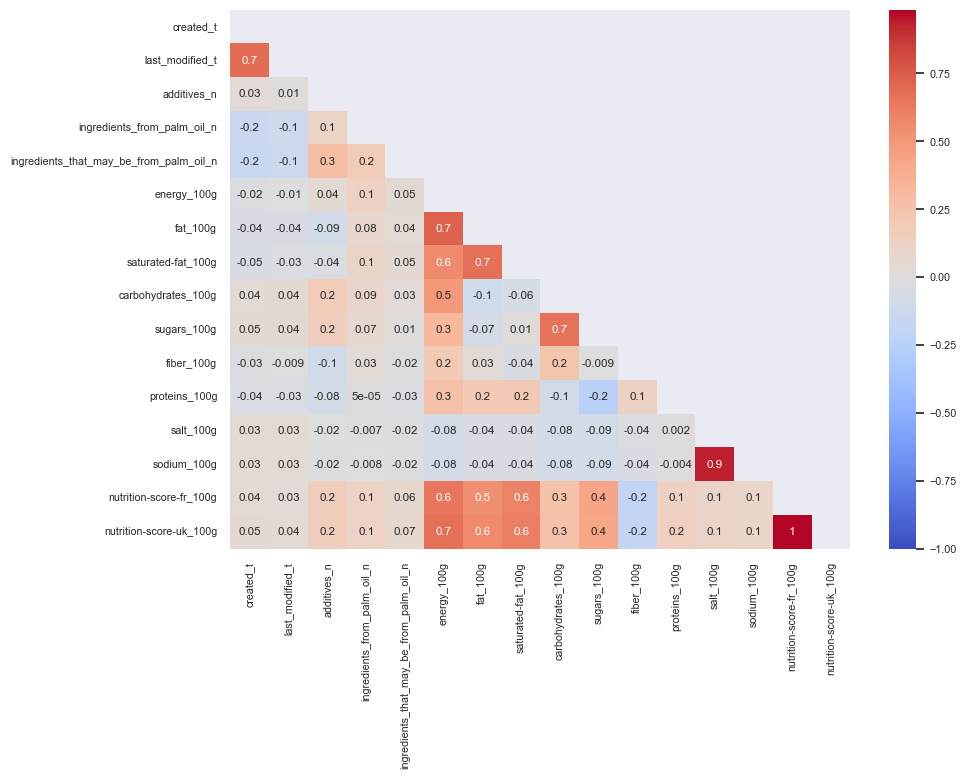

In [99]:
sns.set(font_scale = 0.7,rc={'figure.figsize':(60,20)})
plot_correl_map(data)

# On garde un seul nutrious score pour la suite car elles sont trop fortement correllé (c'est quasiment la même colonne)

In [100]:
data.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'brands',
       'brands_tags', 'countries', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')

In [101]:
new_liste_100 = ['nutrition_grade_fr','energy_100g', 'fat_100g',\
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',\
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

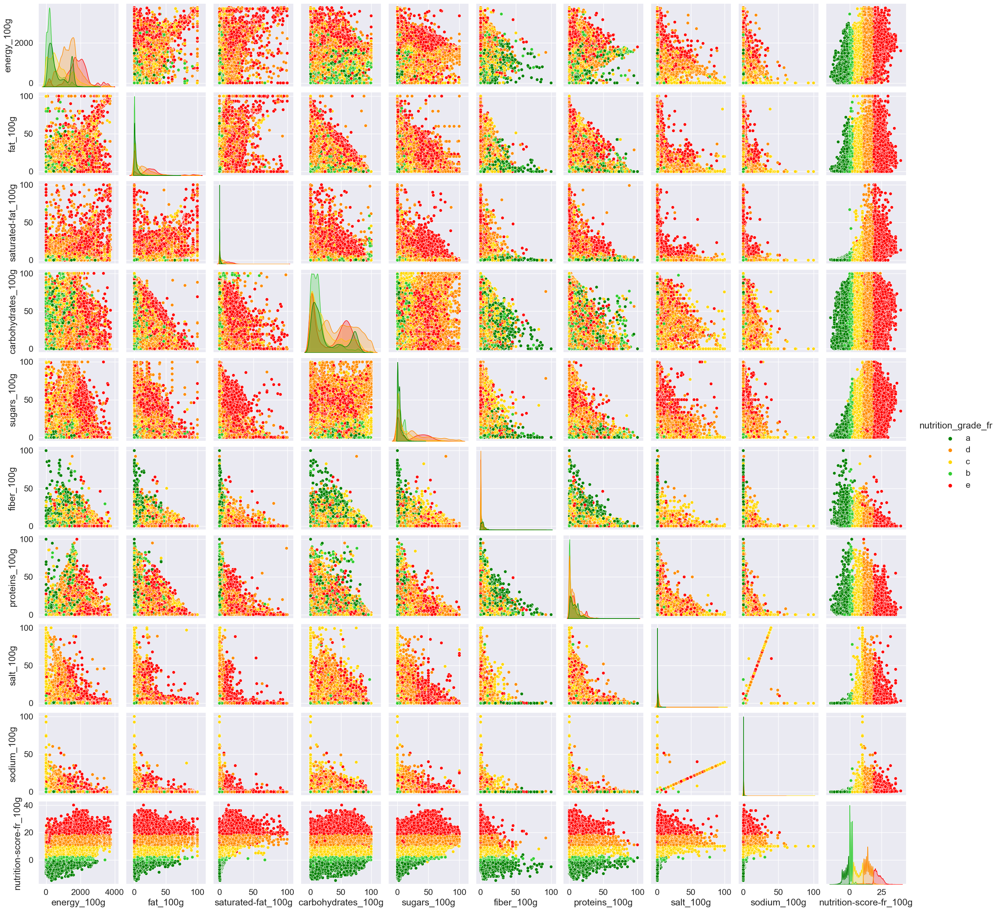

In [102]:
sns.set(font_scale = 1.5)
sns.pairplot(data=data[new_liste_100],hue='nutrition_grade_fr',palette=palette)

In [103]:
new_liste_100

['nutrition_grade_fr',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'nutrition-score-fr_100g']

In [104]:
# On prend une liste plus courte pour faire des réglages sur le pairplot sans que ça mette 3h à sortir
short = ['energy_100g','fat_100g','nutrition_grade_fr']

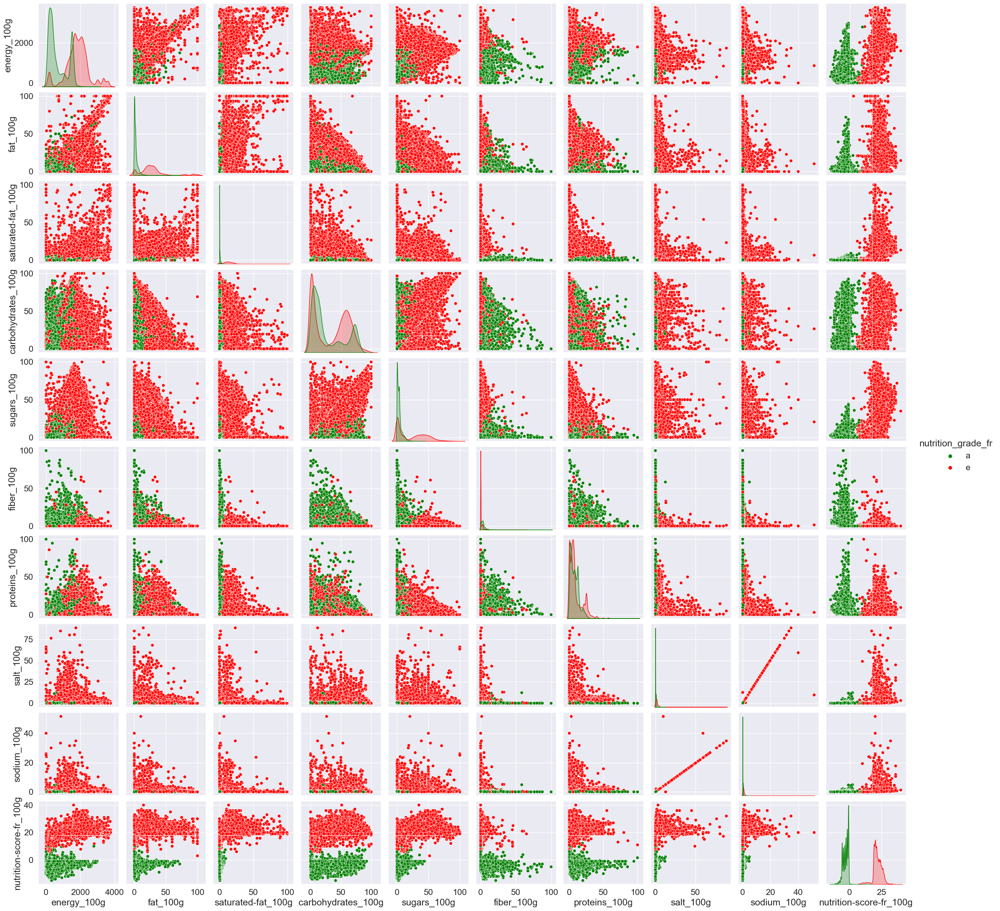

In [105]:
sns.set(font_scale = 1.5)
sns.pairplot(data=data[new_liste_100][data['nutrition_grade_fr'].isin(["a","e"])],hue='nutrition_grade_fr'\
             ,palette={'a': 'green','e': 'red'})

In [106]:
data.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'brands',
       'brands_tags', 'countries', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')

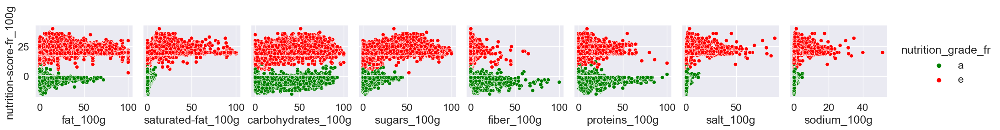

In [107]:
sns.pairplot(data=data[new_liste_100][data['nutrition_grade_fr'].isin(["a","e"])]\
             ,y_vars=['nutrition-score-fr_100g'],x_vars=liste_100,hue='nutrition_grade_fr',palette={'a': 'green','e': 'red'})

# PCA

In [108]:
# fonction récupérer sur open classrooms

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np
import pandas as pd

def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

In [109]:
# A remonter après avoir finis le boulot sur le pca

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [110]:
# On reset les paramètres de matplotlib

import matplotlib


matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [111]:
# On selectionne les features pour le PCA
liste_pca = liste_100 + ['nutrition-score-fr_100g']

liste_pca

['fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'nutrition-score-fr_100g']

In [112]:
data.select_dtypes(include = 'float64')

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
0,0.0,0.0,0.0,1552.0,1.43,0.120,77.140,4.600,5.7,8.57,0.510000,0.200787,-1.8,-1.8
1,0.0,0.0,0.0,1393.0,1.04,0.240,62.500,11.426,12.5,22.92,0.211000,0.082756,-1.8,-1.8
2,0.0,0.0,0.0,1540.0,1.75,0.000,73.680,2.102,1.8,14.04,0.030988,0.012200,-3.4,-3.4
3,0.0,0.0,0.0,2092.0,26.67,23.330,66.670,16.670,3.3,3.33,0.000000,0.000000,15.0,15.0
4,0.0,0.0,0.0,1582.0,2.22,2.064,77.780,2.220,2.2,8.89,0.784000,0.308661,7.2,7.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236489,0.0,0.0,0.0,1477.0,0.00,0.000,87.060,2.350,4.7,1.18,0.030480,0.012000,-1.0,-1.0
236490,NaN,NaN,NaN,1643.0,2.80,0.600,74.800,2.600,5.9,13.00,0.680000,0.267717,-4.0,-4.0
236491,NaN,NaN,NaN,2406.0,47.39,3.730,28.858,3.890,12.2,21.22,0.100000,0.039370,0.0,0.0
236492,0.0,0.0,0.0,21.0,0.20,0.200,0.500,0.500,0.2,0.50,0.025400,0.010000,2.0,0.0


In [113]:
liste_true_pca = data.select_dtypes(include = 'float64').drop(columns='nutrition-score-uk_100g').columns
liste_true_pca

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
      dtype='object')

In [114]:
# On a besoin que d'un seul nutritious score

data_pca = data.dropna().sample(frac=.05).copy()

print(len(data_pca),len(data))

9055 236494


In [115]:
X = data_pca[liste_true_pca].copy()
wine_features = X.columns
X = StandardScaler().fit_transform(data_pca[liste_true_pca])

In [116]:
pca = PCA()

In [117]:
X_pca = pca.fit_transform( X )
df_pca_t = data_pca.copy()
pcols = ["F"+str(i) for i in range(1,X_pca.shape[1]+1)]
df_pca_t.loc[:,pcols] =  X_pca 
#df_pca_t.columns= pcols
df_pca_t["grade"] = data_pca["nutrition_grade_fr"]
df_pca_t = df_pca_t.drop_duplicates()
df_pca_t

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,brands,brands_tags,countries,countries_tags,countries_fr,ingredients_text,serving_size,additives_n,additives,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,states,states_tags,states_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,grade
71873,0041820061963,http://world-fr.openfoodfacts.org/produit/0041...,usda-ndb-import,1489061483,2017-03-09 12:11:23,1489061484,2017-03-09 12:11:24,The Ultimate Vanilla Pudding,Thank You,thank-you,US,en:united-states,États-Unis,"Water, skim milk sugar, corn starch-modified, ...",130 g (0.5 cup),4.0,[ water -> en:water ] [ skim-milk-sugar -> ...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",515.0,2.31,2.31,24.62,16.92,0.0,0.77,0.42926,0.169000,7.0,7.0,-0.875015,-0.591462,0.209083,-0.759412,-0.526440,-0.133591,-0.120239,-0.508319,0.140126,-0.046363,-0.000664,-0.001155,-0.002234,c
126969,0723055863887,http://world-fr.openfoodfacts.org/produit/0723...,usda-ndb-import,1489091943,2017-03-09 20:39:03,1489091944,2017-03-09 20:39:04,Greek Pizza,"Whole Foods Market, Harry's Farmers Market Ltd.","whole-foods-market,harry-s-farmers-market-ltd",US,en:united-states,États-Unis,"Pizza crust (wheat flour, rbst free unsalted b...",131 g (0.5 PIZZA),2.0,[ pizza-crust -> en:pizza-crust ] [ crust -...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",925.0,6.87,3.44,29.01,1.53,0.8,9.92,1.43510,0.565000,10.0,10.0,-0.263658,0.315580,-0.350192,0.012775,-0.069734,-0.247164,-0.491601,0.135434,-0.143796,-0.219978,-0.447150,0.000345,-0.000585,c
78701,0051933344617,http://world-fr.openfoodfacts.org/produit/0051...,usda-ndb-import,1489078726,2017-03-09 16:58:46,1489078726,2017-03-09 16:58:46,"Ginger Evans Bakery, Cake Donuts, Sour Cream",The Moran Group Incorporated,the-moran-group-incorporated,US,en:united-states,États-Unis,"Enriched wheat flour bleached (flour, malted b...",47 g (1 DONUT),2.0,[ enriched-wheat-flour-bleached -> en:enriche...,0.0,0.0,e,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1690.0,23.40,10.64,46.81,25.53,0.0,4.26,0.86360,0.340000,23.0,23.0,2.144385,0.070007,0.262530,-0.308896,-1.037913,0.043580,0.055317,0.029554,0.047679,-0.027038,-0.496990,0.004117,-0.049087,e
130113,0742753316204,http://world-fr.openfoodfacts.org/produit/0742...,usda-ndb-import,1489136479,2017-03-10 09:01:19,1489136479,2017-03-10 09:01:19,Italian Sausage Ravioli,Valley Fine Foods Company,valley-fine-foods-company,US,en:united-states,États-Unis,"Filling ingredients: ricotta cheese (milk, cre...",100 g (4.5 PER TRAY) | (ABOUT),0.0,[ filling-ingredients -> en:filling-ingredien...,0.0,0.0,c,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informations nutritionnelles compl...",1088.0,11.00,5.00,26.00,1.00,2.0,14.00,0.99060,0.390000,9.0,9.0,0.028044,0.662914,-0.882828,0.685821,0.126725,-0.050292,-0.394579,0.579619,-0.045909,-0.165621,-0.286955,0.001740,0.002085,c
58103,0036800331143,http://world-fr.openfoodfacts.org/produit/0036...,usda-ndb-import,1489052869,2017-03-09 09:47:49,1489052869,2017-03-09 09:47:49,Fruit Cocktail In Heavy Syrup,Food Club,food-club,US,en:united-states,États-Unis,"Diced peaches, diced pears, water, grapes, cor...",128 g (0.5 cup),0.0,[ diced-peaches -> en:diced-peaches ] [ pea...,0.0,0.0,b,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","A compléter,Informa

Text(0.5, 1.0, 'variance_ratio_per_component')

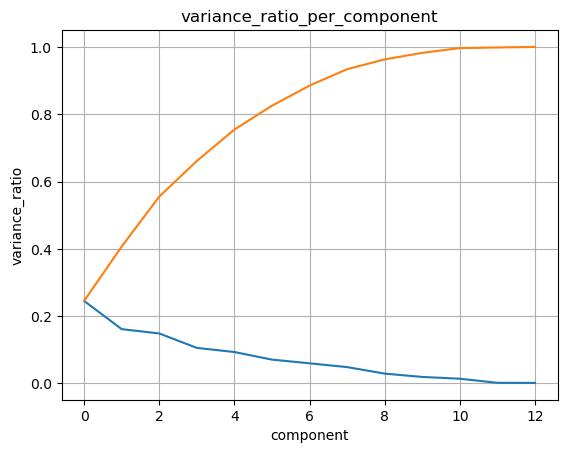

In [118]:
var_r = pca.explained_variance_ratio_
cum_var = np.cumsum(var_r)

plt.plot(var_r)
plt.plot(cum_var)
plt.xlabel('component')
plt.ylabel('variance_ratio')
plt.grid()
plt.title('variance_ratio_per_component')

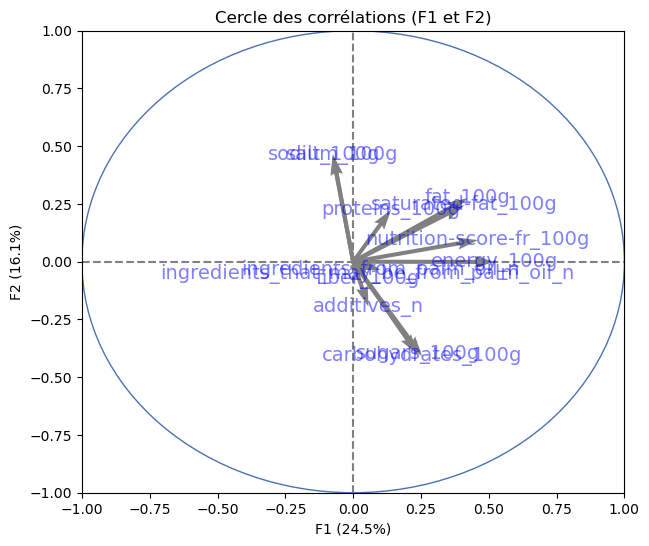

In [119]:
pcs = pca.components_
display_circles(pcs, 7, pca, [(0,1)], labels = np.array(wine_features))

In [120]:
# On récupère la colonne ['nutrition-score-fr_100g']

<AxesSubplot:xlabel='F1', ylabel='F2'>

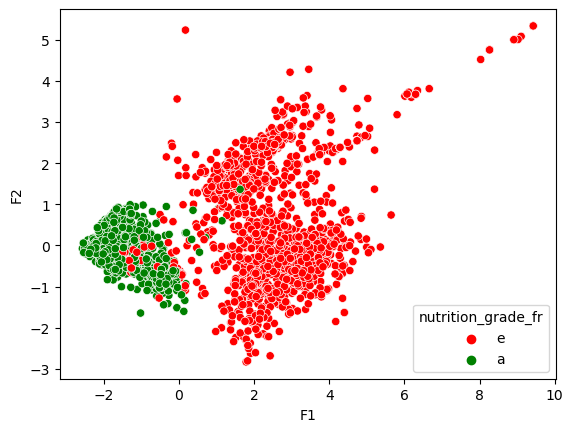

In [121]:
sns.scatterplot(x='F1', y='F2', data=df_pca_t[df_pca_t['nutrition_grade_fr'].isin(['a','e'])],\
           hue='nutrition_grade_fr',palette = palette)

<AxesSubplot:xlabel='F1', ylabel='F2'>

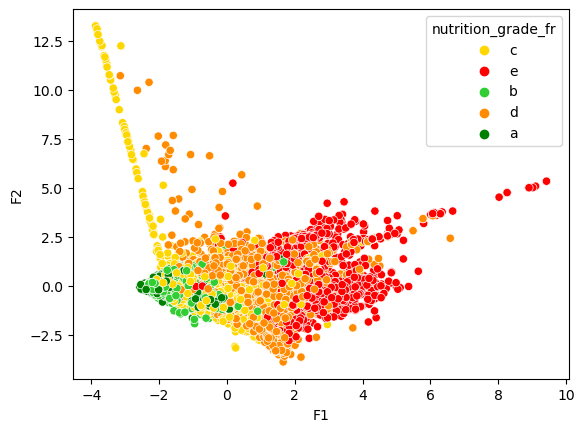

In [122]:
sns.scatterplot(x='F1', y='F2', data=df_pca_t,\
           hue='nutrition_grade_fr',palette = palette)

In [123]:
import pingouin as pg

In [124]:
data.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'brands',
       'brands_tags', 'countries', 'countries_tags', 'countries_fr',
       'ingredients_text', 'serving_size', 'additives_n', 'additives',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g'],
      dtype='object')

In [125]:
liste_100

['fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g']

In [133]:
# Sur le PCA
aov = pg.anova(dv='F1', between='nutrition_grade_fr', data=df_pca_t,
               detailed=True)
aov
# Les 5 nutrious grade sont bien séparé


,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,19094.274101,4,4773.568525,4416.700967,0.0,0.661262
1,Within,9781.236148,9050,1.080800,NaN,NaN,NaN


In [134]:
# On réalise l'analyse ANOVA sur fat, protein, sodium, sugar and fiber par rapport au nutritious 

aov_fat = pg.anova(dv='fat_100g', between='nutrition_grade_fr', data=data,
               detailed=True)
aov_fat.round(3)

# np2 (eta puissance 2) est proche de 1 -> les catégories sont bien séparés statistiquement par la variable souhaité

,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,1.926953e+07,4,4817382.049,25860.762,0.0,0.304
1,Within,4.405353e+07,236489,186.282,NaN,NaN,NaN


In [135]:
aov_prot = pg.anova(dv='proteins_100g', between='nutrition_grade_fr', data=data,
               detailed=True)
aov_prot.round(3)

,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,6.997630e+05,4,174940.759,2963.437,0.0,0.048
1,Within,1.396067e+07,236489,59.033,NaN,NaN,NaN


In [136]:
aov_sodium = pg.anova(dv='sodium_100g', between='nutrition_grade_fr', data=data,
               detailed=True)
aov_sodium.round(3)

,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,44478.205,4,11119.551,1596.2,0.0,0.026
1,Within,1647444.528,236489,6.966,NaN,NaN,NaN


In [137]:
aov_sugar = pg.anova(dv='sugars_100g', between='nutrition_grade_fr', data=data,
               detailed=True)
aov_sugar.round(3)

,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,1.934097e+07,4,4835242.714,13927.125,0.0,0.191
1,Within,8.210465e+07,236489,347.182,NaN,NaN,NaN


In [138]:
aov_fiber = pg.anova(dv='fiber_100g', between='nutrition_grade_fr', data=data,
               detailed=True)
aov_fiber.round(3)

,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,182054.763,4,45513.691,5272.501,0.0,0.082
1,Within,2041438.564,236489,8.632,NaN,NaN,NaN


In [139]:
ao = pg.anova(dv='saturated-fat_100g', between='nutrition_grade_fr', data=data,
               detailed=True)
ao.round(3)

,Source,SS,DF,MS,F,p-unc,np2
0,nutrition_grade_fr,5113266.314,4,1278316.579,36379.004,0.0,0.381
1,Within,8309952.790,236489,35.139,NaN,NaN,NaN
